In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import calendar
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from scipy.interpolate import make_interp_spline

In [2]:
def read_data() -> pd.DataFrame:
    def restore_timezone(row: pd.Series) -> pd.Series:
        row.datetime = row.datetime.tz_convert(row.tz)
        return row
    
    def adjust_dst(row: pd.Series) -> pd.Series:
        if row.datetime.dst().total_seconds() > 0:
            row.datetime += pd.Timedelta(hours=1)
        return row

    d = pd.read_csv("preprocessing/commercial.csv")
    d["datetime"] = pd.to_datetime(d["Date/Time"], utc=True)
    
    # Now continue with your functions
    d = d.apply(restore_timezone, axis="columns")
    d = d.apply(adjust_dst, axis="columns")
    d["total"] = ( d["Electricity:Facility [kW](Hourly)"] + d["Fans:Electricity [kW](Hourly)"] + d["Cooling:Electricity [kW](Hourly)"] + d["Heating:Electricity [kW](Hourly)"] + d["InteriorLights:Electricity [kW](Hourly)"] + d["InteriorEquipment:Electricity [kW](Hourly)"])
    d["hour"]  = d["datetime"].dt.hour
    d["dow"]   = d["datetime"].dt.day_of_week
    d["doy"]   = d["datetime"].dt.day_of_year
    d["month"] = d["datetime"].dt.month
    
    return d

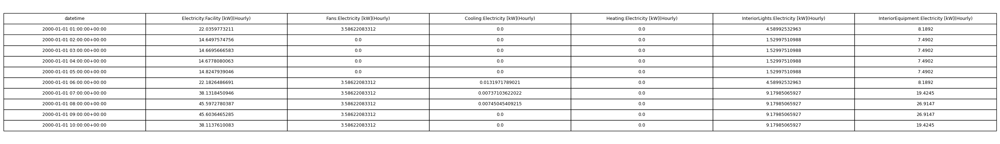

In [24]:
# Load CSV
df = pd.read_csv("preprocessing/commercial.csv")

# Keep only the required columns
required_cols = [
    "Date/Time",
    "Electricity:Facility [kW](Hourly)",
    "Fans:Electricity [kW](Hourly)",
    "Cooling:Electricity [kW](Hourly)",
    "Heating:Electricity [kW](Hourly)",
    "InteriorLights:Electricity [kW](Hourly)",
    "InteriorEquipment:Electricity [kW](Hourly)"
]
df = df[required_cols]

# Remove duplicate rows
df = df.drop_duplicates()

# Convert "Date/Time" into proper datetime (add dummy year 2000)
df["datetime"] = pd.to_datetime(
    "2000/" + df["Date/Time"].str.strip(),
    format="%Y/%m/%d %H:%M:%S",
    errors="coerce",
    utc=True
)

# Drop the old column
df = df.drop(columns=["Date/Time"])

# Reorder so datetime comes first
df = df[["datetime"] + [col for col in df.columns if col != "datetime"]]

# Save cleaned CSV
df.to_csv("preprocessing/commercial_clean.csv", index=False)

# print("✅ Cleaned file saved as preprocessing/commercial_clean.csv")
# print(df.head())

fig, ax = plt.subplots(figsize=(20, 5))  # adjust width/height for clarity
ax.axis("off")

table = ax.table(
    cellText=df.head(10).values,      # first 10 rows
    colLabels=df.columns,             # column headers
    cellLoc="center", loc="center"
)

# Style adjustments
table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1.8, 1.8)  # scale table size

plt.show()

In [4]:
def read_data():
    d = pd.read_csv("preprocessing/commercial.csv")
    
    # Check first few values
    print("Before fixing:", d["Date/Time"].head())
    
    # Add a dummy year (e.g., 2024) in front of Date/Time
    d["Date/Time"] = "2024/" + d["Date/Time"].astype(str).str.strip()
    
    # Now parse datetime
    d["datetime"] = pd.to_datetime(d["Date/Time"], format="%Y/%m/%d %H:%M:%S", errors="coerce")
    
    print("After fixing:", d["datetime"].head())
    return d

d = read_data()

Before fixing: 0     01/01  01:00:00
1     01/01  02:00:00
2     01/01  03:00:00
3     01/01  04:00:00
4     01/01  05:00:00
Name: Date/Time, dtype: object
After fixing: 0   2024-01-01 01:00:00
1   2024-01-01 02:00:00
2   2024-01-01 03:00:00
3   2024-01-01 04:00:00
4   2024-01-01 05:00:00
Name: datetime, dtype: datetime64[ns]


In [5]:
def quantile_plot(d: pd.DataFrame, **kwargs):
    grouper_col = kwargs.get("grouper_col", "building_type")
    grouper_val_fmt = kwargs.get("grouper_val_fmt", lambda x: " ".join(str(x).split("_")).title())
    plotter_col = kwargs.get("plotter_col", "total")
    plotter_col_label = kwargs.get("plotter_col_label", "Total energy consumption (kWh)")
    ncols = kwargs.get("ncols", 4)

    # --- Handle missing grouper_col ---
    if grouper_col not in d.columns:
        if "station_folder" in d.columns:
            grouper_col = "station_folder"
        elif "file_name" in d.columns:
            grouper_col = "file_name"
        else:
            grouper_col = d.columns[0]  # fallback to first column

    # --- Handle missing plotter_col ---
    if plotter_col not in d.columns:
        # try to compute "total" if possible
        energy_cols = [c for c in d.columns if any(k in c for k in ["Electricity", "Gas"])]
        if energy_cols:
            d["total"] = d[energy_cols].sum(axis=1)
            plotter_col = "total"
            plotter_col_label = "Total energy consumption (kWh)"
        else:
            # fallback: first numeric column
            num_cols = d.select_dtypes(include="number").columns
            if len(num_cols) == 0:
                raise KeyError("No numeric column available to plot")
            plotter_col = num_cols[0]
            plotter_col_label = plotter_col

    by_grouper = d.groupby(grouper_col)
    nrows = len(by_grouper) // ncols
    nrows += 1 if len(by_grouper) % ncols != 0 else 0
    cols = [plt.cm.tab20c(i) for i in range(4)]

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6 * ncols, 4 * nrows))

    for idx, (grp, ax) in enumerate(zip(by_grouper, axes.flat)):
        group_name, grp = grp
        hr = grp.datetime.apply(lambda dt: dt.hour)

        quantiles = (0.3, 0.4, 0.5, 0.6, 0.7)

        quantile_series = {
            q: grp.groupby(hr)[plotter_col].quantile(q).sort_index()
            for q in quantiles
        }
        x = {q: s.index for q, s in quantile_series.items()}
        y = {q: s.values for q, s in quantile_series.items()}

        if (k := kwargs.get("smooth")) is not None:
            xold, yold = x.copy(), y.copy()
            spl = {q: make_interp_spline(x=xold[q], y=yold[q], k=k) for q in xold}
            x = {q: np.linspace(s.min(), s.max(), num=100) for q, s in x.items()}
            y = {q: spl[q](x[q]) for q in y}

        ax.plot(x[quantiles[2]], y[quantiles[2]], color=cols[0])
        ax.fill_between(x[quantiles[1]], y[quantiles[1]], y[quantiles[3]], color=cols[1], alpha=0.5)
        ax.fill_between(x[quantiles[0]], y[quantiles[0]], y[quantiles[4]], color=cols[2], alpha=0.25)

        ax.set_title(grouper_val_fmt(group_name))
        ax.set_xticks(range(0, 24, 2))
        ax.set_xticklabels([f"{h:02d}:00" for h in range(0, 24, 2)], rotation=90, ha="center")
        ax.spines["top"].set_color(None)
        ax.spines["right"].set_color(None)

        if idx % ncols == 0:
            ax.set_ylabel(plotter_col_label)

    for idx in range(len(by_grouper), nrows * ncols):
        fig.delaxes(axes.flat[idx])

    el = [
        Line2D([0], [0], color=cols[0], lw=2, label="Percentile 50"),
        Patch(facecolor=cols[1], edgecolor=cols[0], alpha=0.5, label="Percentiles 40-60"),
        Patch(facecolor=cols[2], edgecolor=cols[1], alpha=0.25, label="Percentiles 30-70"),
    ]

    figtop = 1.0
    bboxv = kwargs.get("bboxv", 1.05)

    if (title := kwargs.get("title")) is not None:
        fig.suptitle(title, fontsize=16)
        figtop = kwargs.get("figtop", 0.88)
        bboxv = kwargs.get("bboxv", 0.95)

    fig.legend(handles=el, loc="upper center", bbox_to_anchor=(0.5, bboxv), ncols=3)
    fig.tight_layout()
    fig.subplots_adjust(hspace=0.4, wspace=0.2, top=figtop)

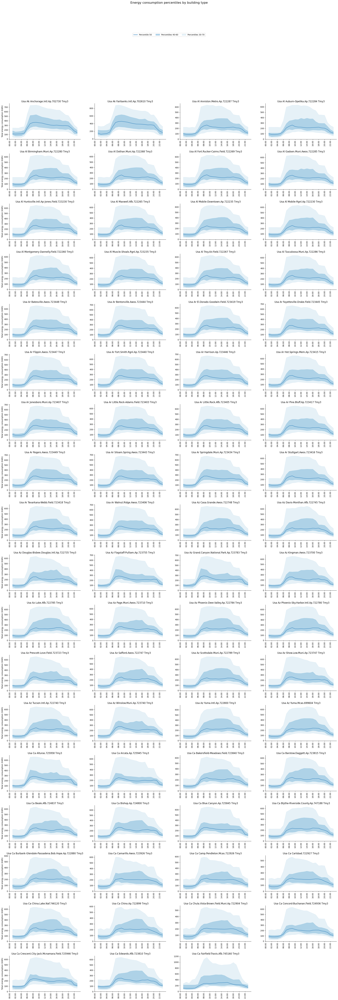

In [6]:
quantile_plot(d, title="Energy consumption percentiles by building type")

In [7]:
def ghost_plot(d: pd.DataFrame, **kwargs):
    # Pick a valid grouper column
    grouper_col = kwargs.get('grouper_col', None)
    if grouper_col is None or grouper_col not in d.columns:
        # fallback if building_type doesn't exist
        if "station_folder" in d.columns:
            grouper_col = "station_folder"
        elif "file_name" in d.columns:
            grouper_col = "file_name"
        else:
            raise KeyError("No valid grouper column found in dataframe!")

    grouper_val_fmt = kwargs.get('grouper_val_fmt', lambda x: ' '.join(str(x).split('_')).title())
    plotter_col = kwargs.get('plotter_col', 'total')
    plotter_col_label = kwargs.get('plotter_col_label', 'Total energy consumption (kWh)')
    ncols = kwargs.get('ncols', 4)
    alpha = kwargs.get('alpha', 0.01)

    # Ensure datetime column exists
    if "datetime" not in d.columns:
        d["datetime"] = pd.to_datetime(d["Date/Time"], errors="coerce")

    # Ensure "total" exists
    if plotter_col not in d.columns:
        d["total"] = (
            d.get("Electricity:Facility [kW](Hourly)", 0) +
            d.get("Gas:Facility [kW](Hourly)", 0)
        )

    by_grouper = d.groupby(grouper_col)
    nrows = len(by_grouper) // ncols
    nrows += 1 if len(by_grouper) % ncols != 0 else 0

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6*ncols, 4*nrows))

    for idx, (grp, ax) in enumerate(zip(by_grouper, axes.flat)):
        group_name, grp = grp
        day = grp.datetime.dt.dayofyear

        for _, by_day in grp.groupby(day):
            hr = by_day.datetime.dt.hour
            pltd = by_day.groupby(hr)[plotter_col].mean()
            ax.plot(pltd.index, pltd.values, color='C0', alpha=alpha)

        ax.set_title(grouper_val_fmt(group_name))
        ax.set_xticks(range(0, 24, 2))
        ax.set_xticklabels([f"{h:02d}:00" for h in range(0, 24, 2)], rotation=90, ha='center')
        ax.spines['top'].set_color(None)
        ax.spines['right'].set_color(None)

        if idx % ncols == 0:
            ax.set_ylabel(plotter_col_label)

    # remove empty axes
    for idx in range(len(by_grouper), nrows * ncols):
        fig.delaxes(axes.flat[idx])

    figtop = 1.0
    if (title := kwargs.get('title')) is not None:
        fig.suptitle(title, fontsize=16)
        figtop = kwargs.get('figtop', 0.88)

    fig.tight_layout()
    fig.subplots_adjust(hspace=0.4, wspace=0.2, top=figtop)
    plt.show()


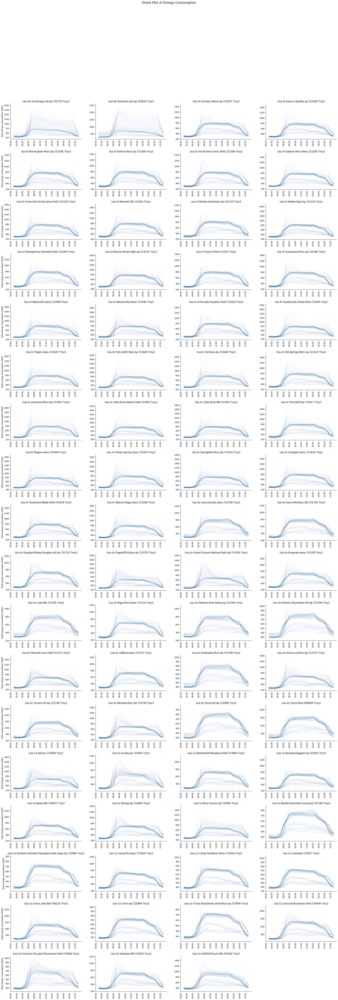

In [8]:
ghost_plot(d, title="Ghost Plot of Energy Consumption")

In [9]:
def heatmap(d: pd.DataFrame, **kwargs):
    # Choose grouper column safely
    grouper_col = kwargs.get('grouper_col', None)
    if grouper_col is None or grouper_col not in d.columns:
        if "station_folder" in d.columns:
            grouper_col = "station_folder"
        elif "file_name" in d.columns:
            grouper_col = "file_name"
        else:
            raise KeyError("No valid grouper column found in dataframe!")

    grouper_val_fmt = kwargs.get('grouper_val_fmt', lambda x: ' '.join(str(x).split('_')).title())
    plotter_col = kwargs.get('plotter_col', 'total')
    plotter_high_low_limit = kwargs.get('plotter_high_low_limit', 500)

    # Ensure datetime exists
    if "datetime" not in d.columns:
        d["datetime"] = pd.to_datetime(d["Date/Time"], errors="coerce")

    # Ensure total exists
    if plotter_col not in d.columns:
        d["total"] = (
            d.get("Electricity:Facility [kW](Hourly)", 0) +
            d.get("Gas:Facility [kW](Hourly)", 0)
        )

    # Extract hour of day
    hr = d["datetime"].dt.hour

    # Create pivot table (renaming to avoid shadowing pandas)
    pivot_df = d.pivot_table(index=grouper_col, columns=hr, values=plotter_col)

    # Separate high vs low consumption groups
    pd_high = pivot_df[pivot_df.apply(lambda row: (row > plotter_high_low_limit).any(), axis='columns')]
    pd_low = pivot_df[pivot_df.apply(lambda row: (row <= plotter_high_low_limit).all(), axis='columns')]

    if pd_high.empty and pd_low.empty:
        raise ValueError("No valid data for heatmap.")

    hmin, hmax = pd_high.min().min(), pd_high.max().max() if not pd_high.empty else (0, 1)
    lmin, lmax = pd_low.min().min(), pd_low.max().max() if not pd_low.empty else (0, 1)

    fig, axes = plt.subplots(
        ncols=2, nrows=2,
        figsize=(10, 6),
        height_ratios=[len(pd_high) if not pd_high.empty else 1,
                       len(pd_low) if not pd_low.empty else 1],
        width_ratios=[95, 5]
    )
    fig.subplots_adjust(wspace=0.3)

    # Plot heatmaps
    if not pd_high.empty:
        sns.heatmap(data=pd_high, cmap='Blues', ax=axes.flat[0], cbar_ax=axes.flat[1],
                    cbar_kws=dict(ticks=np.linspace(hmin, hmax, num=4)))
        axes.flat[0].set_title('High-consumption group')

    if not pd_low.empty:
        sns.heatmap(data=pd_low, cmap='Greens', ax=axes.flat[2], cbar_ax=axes.flat[3],
                    cbar_kws=dict(ticks=np.linspace(lmin, lmax, num=4)))
        axes.flat[2].set_title('Low-consumption group')

    # Formatting
    for ax in (axes.flat[0], axes.flat[2]):
        if ax.has_data():
            for y in range(len(ax.get_yticklabels())):
                ax.axhline(y, color='white')

            ax.set_yticklabels([grouper_val_fmt(x.get_text()) for x in ax.get_yticklabels()])
            ax.set_xlabel('')
            ax.set_ylabel('')
            ax.tick_params(left=False, bottom=False)

    fig.tight_layout()
    plt.show()

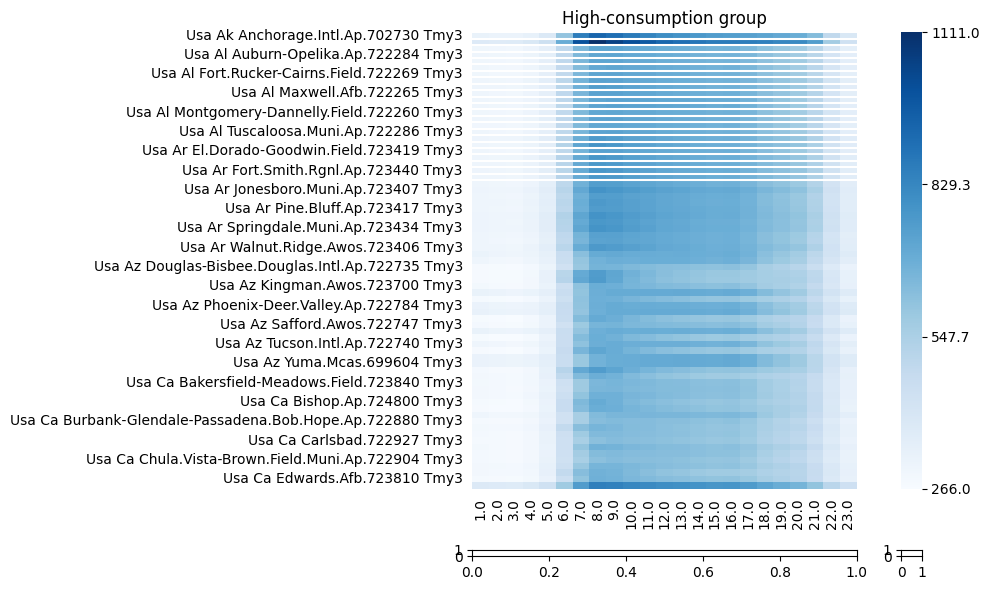

In [10]:
heatmap(d, title="Energy Consumption Heatmap")

In [11]:
def quantile_plot(
    d, 
    plotter_col="main",            # Column to plot (default = Electricity:Facility kW)
    grouper_col="dow",             # Column to group by (day of week, month, etc.)
    grouper_val_fmt=lambda x: x,   # Function to format group labels
    title=None,
    figtop=0.85,
    bboxv=0.95
):
    # Define quantiles (10th, 25th, 50th, 75th, 90th)
    qs = [0.1, 0.25, 0.5, 0.75, 0.9]
    
    # Compute quantiles grouped by the grouper_col
    grouped = (
        d.groupby(grouper_col)[plotter_col]
        .quantile(qs)
        .unstack()
    )

    # Rename columns for clarity
    grouped.columns = [f"{int(q*100)}th" for q in qs]
    
    # Apply formatter to x labels
    grouped.index = [grouper_val_fmt(x) for x in grouped.index]
    
    # Plot
    plt.figure(figsize=(10, 6))
    for col in grouped.columns:
        plt.plot(grouped.index, grouped[col], marker="o", label=col)

    plt.title(title if title else f"{plotter_col} Quantile Plot", fontsize=14)
    plt.xlabel(grouper_col, fontsize=12)
    plt.ylabel("kW", fontsize=12)
    plt.legend(title="Quantiles", bbox_to_anchor=(1.05, bboxv), loc="upper left")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [12]:
# Extract building_type from the file_name column
d['building_type'] = d['file_name'].apply(
    lambda x: x.split('_')[0].replace("RefBldg", "").lower() if pd.notnull(x) else "unknown"
)

# Normalize names for consistency
d['building_type'] = d['building_type'].replace({
    'primaryschool': 'primary_school',
    'stripmall': 'strip_mall'
})

d['datetime'] = pd.to_datetime(d['Date/Time'], errors='coerce')
d['dow'] = d['datetime'].dt.dayofweek   # 0=Monday, 6=Sunday
d['month'] = d['datetime'].dt.month

ps = d[d.building_type == 'primary_school']
sm = d[d.building_type == 'strip_mall']

# Vectorized building_type extraction

In [13]:
# Use regex + string methods instead of apply()
d['building_type'] = (
    d['file_name']
    .str.extract(r'^(?:RefBldg)?([A-Za-z]+)', expand=False)  # capture main type
    .str.lower()
    .fillna("unknown")
)

# Normalize names
d['building_type'] = d['building_type'].replace({
    'primaryschool': 'primary_school',
    'stripmall': 'strip_mall'
})

# --- Use existing datetime column if already parsed ---
if 'datetime' not in d.columns:
    d['datetime'] = pd.to_datetime(d['Date/Time'], errors='coerce')

# Extract day-of-week and month (vectorized)
d['dow'] = d['datetime'].dt.dayofweek
d['month'] = d['datetime'].dt.month

# --- Filtering subsets (use .query for readability & speed) ---
ps = d.query("building_type == 'primary_school'")
sm = d.query("building_type == 'strip_mall'")

print(ps.head(), sm.head())

Empty DataFrame
Columns: [Date/Time, Electricity:Facility [kW](Hourly), Fans:Electricity [kW](Hourly), Cooling:Electricity [kW](Hourly), Heating:Electricity [kW](Hourly), InteriorLights:Electricity [kW](Hourly), InteriorEquipment:Electricity [kW](Hourly), Gas:Facility [kW](Hourly), Heating:Gas [kW](Hourly), InteriorEquipment:Gas [kW](Hourly), Water Heater:WaterSystems:Gas [kW](Hourly), station_folder, file_name, Electricity:Facility [kW](Monthly), Gas:Facility [kW](Monthly), datetime, total, building_type, dow, month]
Index: [] Empty DataFrame
Columns: [Date/Time, Electricity:Facility [kW](Hourly), Fans:Electricity [kW](Hourly), Cooling:Electricity [kW](Hourly), Heating:Electricity [kW](Hourly), InteriorLights:Electricity [kW](Hourly), InteriorEquipment:Electricity [kW](Hourly), Gas:Facility [kW](Hourly), Heating:Gas [kW](Hourly), InteriorEquipment:Gas [kW](Hourly), Water Heater:WaterSystems:Gas [kW](Hourly), station_folder, file_name, Electricity:Facility [kW](Monthly), Gas:Facility [

In [14]:
def quantile_plot(d: pd.DataFrame, **kwargs):
    grouper_col = kwargs.get('grouper_col', 'dow')
    grouper_val_fmt = kwargs.get('grouper_val_fmt', lambda x: x)
    plotter_col = kwargs.get('plotter_col', 'Electricity:Facility [kW](Hourly)')
    title = kwargs.get('title', 'Quantile plot')
    figtop = kwargs.get('figtop', 0.9)
    bboxv = kwargs.get('bboxv', 1.0)

    quantiles = [0.05, 0.25, 0.5, 0.75, 0.95]

    # Compute quantiles properly → DataFrame with columns as quantiles
    grouped = (
        d.groupby([grouper_col, d['datetime'].dt.hour])[plotter_col]
        .quantile(quantiles)
        .reset_index()
    )

    # Rename quantile column
    grouped.rename(columns={plotter_col: "value"}, inplace=True)

    fig, ax = plt.subplots(figsize=(10, 6))

    for q in quantiles:
        df_q = grouped[grouped['level_2'] == q]  # 'level_2' = quantile index after reset
        avg = df_q.groupby('datetime').mean(numeric_only=True)['value']
        ax.plot(avg.index, avg.values, label=f"{int(q*100)}th percentile")

    ax.set_title(title)
    ax.set_xlabel("Hour of Day")
    ax.set_ylabel(f"{plotter_col} (kWh)")
    ax.legend(bbox_to_anchor=(1.05, bboxv), loc="upper left")
    plt.tight_layout()
    plt.subplots_adjust(top=figtop)
    plt.show()


# Preprocess

In [15]:
def preprocess_data(d: pd.DataFrame) -> pd.DataFrame:
    if "datetime" not in d.columns:
        d['datetime'] = pd.to_datetime(d['Date/Time'], errors='coerce')
    d['dow'] = d['datetime'].dt.dayofweek   # 0=Mon, 6=Sun
    d['month'] = d['datetime'].dt.month
    
    # Vectorized building_type extraction
    if 'file_name' in d.columns:
        d['building_type'] = (
            d['file_name']
            .str.extract(r'^(?:RefBldg)?([A-Za-z]+)', expand=False)
            .str.lower()
            .fillna("unknown")
            .replace({
                'primaryschool': 'primary_school',
                'stripmall': 'strip_mall'
            })
        )
    else:
        d['building_type'] = 'unknown'
    return d

# Quantile Plot (Matplotlib)

In [16]:
def quantile_plot(
    d: pd.DataFrame,
    plotter_col="Electricity:Facility [kW](Hourly)",
    grouper_col="dow",
    grouper_val_fmt=lambda x: x,
    title=None,
    figtop=0.85,
    bboxv=0.95
):
    quantiles = [0.1, 0.25, 0.5, 0.75, 0.9]

    grouped = (
        d.groupby(grouper_col)[plotter_col]
        .quantile(quantiles)
        .unstack()
    )

    # Check for empty result
    if grouped.empty:
        print(f"⚠️ Skipping plot: no data for {plotter_col} by {grouper_col}")
        return

    if grouped.shape[1] == len(quantiles):
        grouped.columns = [f"{int(q*100)}th" for q in quantiles]

    grouped.index = [grouper_val_fmt(x) for x in grouped.index]

    # Plot
    plt.figure(figsize=(10, 6))
    for col in grouped.columns:
        plt.plot(grouped.index, grouped[col], marker="o", label=col)

    plt.title(title or f"{plotter_col} Quantile Plot", fontsize=14)
    plt.xlabel(grouper_col, fontsize=12)
    plt.ylabel("kW", fontsize=12)
    plt.legend(title="Quantiles", bbox_to_anchor=(1.05, bboxv), loc="upper left")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [17]:
print(ps.shape, sm.shape)
print(ps['building_type'].unique())

(0, 20) (0, 20)
[]


In [18]:
import re

def preprocess_data(d: pd.DataFrame) -> pd.DataFrame:
    if "datetime" not in d.columns:
        d['datetime'] = pd.to_datetime(d['Date/Time'], errors='coerce')
    d['dow'] = d['datetime'].dt.dayofweek   # 0=Mon, 6=Sun
    d['month'] = d['datetime'].dt.month
    
    # Extract building_type from file_name
    if 'file_name' in d.columns:
        def extract_type(fname):
            if pd.isna(fname):
                return "unknown"
            # Remove RefBldg prefix if present
            fname = fname.replace("RefBldg", "").lower()
            # Explicit checks
            if "primaryschool" in fname:
                return "primary_school"
            if "stripmall" in fname:
                return "strip_mall"
            # Fallback: keep only letters
            m = re.match(r"([a-z]+)", fname)
            return m.group(1) if m else "unknown"

        d['building_type'] = d['file_name'].map(extract_type)
    else:
        d['building_type'] = 'unknown'
    
    return d


In [19]:
d = preprocess_data(d)

print(d['building_type'].value_counts())  # check distribution

ps = d.query("building_type == 'primary_school'")
sm = d.query("building_type == 'strip_mall'")

print(ps.shape, sm.shape)  # should now be non-empty

building_type
fullservicerestaurantnew     621960
hospitalnew                  621960
largehotelnew                621960
largeofficenew               621960
mediumofficenew              621960
midriseapartmentnew          621960
outpatientnew                621960
primary_school               621960
quickservicerestaurantnew    621960
secondaryschoolnew           621960
smallhotelnew                621960
smallofficenew               617932
stand                        613200
strip_mall                   613200
supermarketnew               613200
warehousenew                 613200
Name: count, dtype: int64
(621960, 20) (613200, 20)


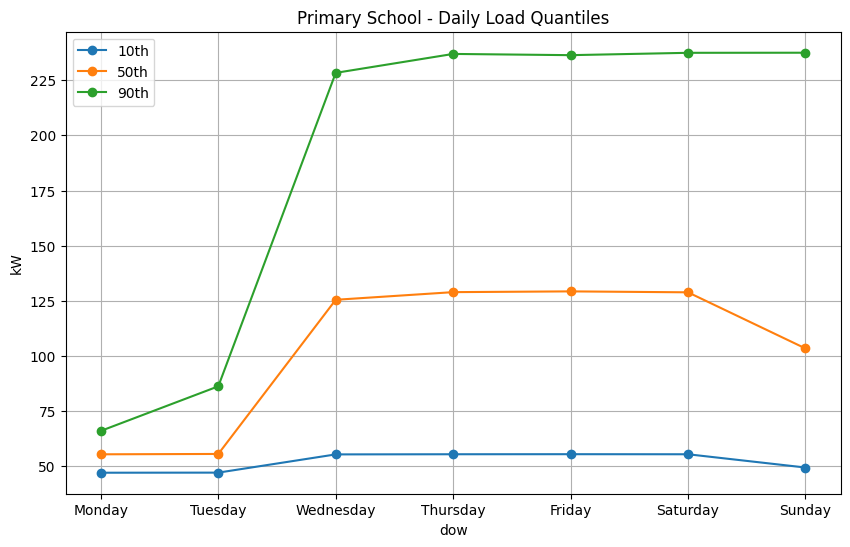

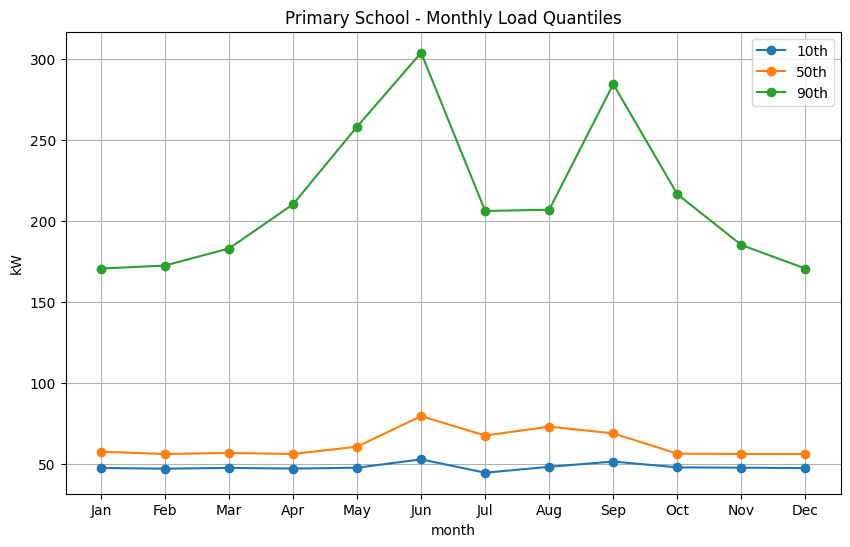

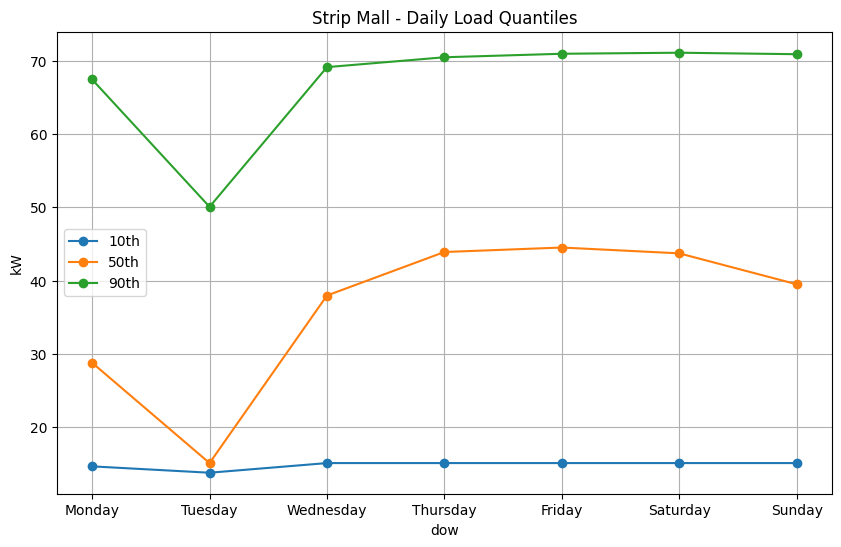

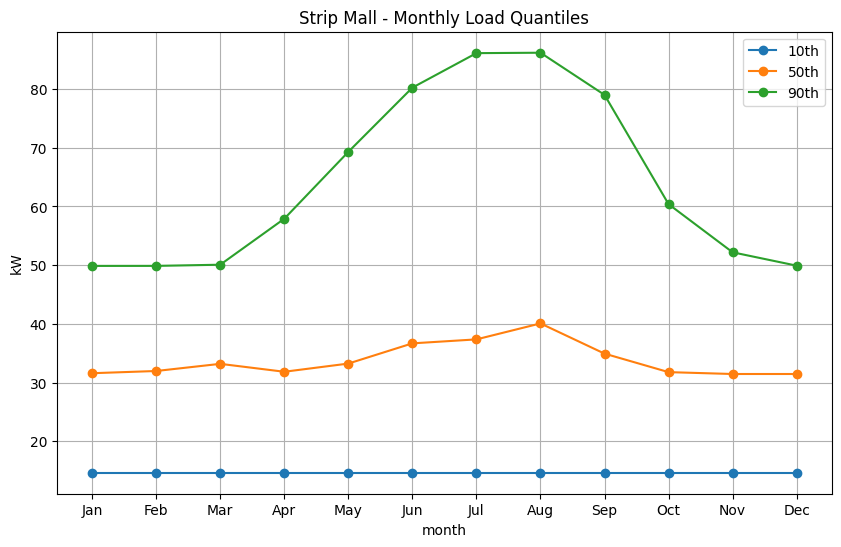

In [20]:
def quantile_plot(d, value_col="Electricity:Facility [kW](Hourly)", grouper_col="dow",
                  grouper_val_fmt=None, title="", quantiles=[0.1, 0.5, 0.9]):
    """
    Plot quantile profiles of energy use grouped by some column (dow, month, etc.)
    """
    grouped = d.groupby(grouper_col)[value_col].quantile(quantiles).unstack()

    # Rename columns
    grouped.columns = [f"{int(q*100)}th" for q in quantiles]

    # Format x-axis labels
    if grouper_val_fmt:
        grouped.index = [grouper_val_fmt(x) for x in grouped.index]

    # Plot
    plt.figure(figsize=(10, 6))
    for col in grouped.columns:
        plt.plot(grouped.index, grouped[col], marker="o", label=col)
    plt.title(title)
    plt.xlabel(grouper_col)
    plt.ylabel("kW")
    plt.legend()
    plt.grid(True)
    plt.show()


# --- Primary School ---
quantile_plot(
    ps, 
    grouper_col="dow", 
    grouper_val_fmt=lambda x: calendar.day_name[int(x)], 
    title="Primary School - Daily Load Quantiles"
)

quantile_plot(
    ps, 
    grouper_col="month", 
    grouper_val_fmt=lambda x: calendar.month_abbr[int(x)], 
    title="Primary School - Monthly Load Quantiles"
)

# --- Strip Mall ---
quantile_plot(
    sm, 
    grouper_col="dow", 
    grouper_val_fmt=lambda x: calendar.day_name[int(x)], 
    title="Strip Mall - Daily Load Quantiles"
)

quantile_plot(
    sm, 
    grouper_col="month", 
    grouper_val_fmt=lambda x: calendar.month_abbr[int(x)], 
    title="Strip Mall - Monthly Load Quantiles"
)